## Tile Generation

In [1]:
from PIL import Image
import os

def get_all_char_before_dot(s):
    dot_index = s.find('.')
    if dot_index > 0:
        return s[:dot_index]
    else:
        return None  # Return None if there's no character before the dot

def generate_tiles(image_path, tile_width, tile_height, step, output_folder):
    # Open the image
    image = Image.open(image_path)
    image_width, image_height = image.size

    # Generate tiles
    for x in range(0, image_width - tile_width + 1, step):
        for y in range(0, image_height - tile_height + 1, step):
            # Define the bounding box for the current tile
            left = x
            upper = y
            right = left + tile_width
            lower = upper + tile_height
            bbox = (left, upper, right, lower)

            # Crop the image to the bounding box to create the tile
            tile = image.crop(bbox)

            # Save the tile to the output folder
            image_file_name=os.path.basename(image_path)
            image_idx = get_all_char_before_dot(image_file_name)
            tile.save(f"{output_folder}/{image_idx}_{x}_{y}.png") #image_id_x_y.png

    print(f"Tiles from {image_file_name} are generated successfully.")


In [2]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import re
import glob
import os
from PIL import Image

# Helper function to extract characters before the dot
def get_all_char_before_dot(s):
    dot_index = s.find('.')
    if dot_index > 0:
        return s[:dot_index]
    else:
        return None  # Return None if there's no character before the dot

def generate_tiles_WH(image_path, tile_width, tile_height, step, output_folder):
    # Open the image
    image = Image.open(image_path)
    image_width, image_height = image.size
    print(f"Processing image {os.path.basename(image_path)} with size {image_width}x{image_height}")

    # Convert image to numpy array for easier handling of partial tiles
    image_np = np.array(image)
    if image_np.shape[-1] == 4:  # Handle RGBA
        image_np = image_np[..., :3]  # Remove alpha channel

    # Calculate the number of tiles along each dimension
    num_tiles_x = (image_width - tile_width + step - 1) // step + 1
    num_tiles_y = (image_height - tile_height + step - 1) // step + 1
    print(f"Expected number of tiles: {num_tiles_x}x{num_tiles_y} = {num_tiles_x * num_tiles_y}")

    tile_count = 0
    # Generate tiles, including partial tiles at the edges
    for x in range(0, image_width, step):
        for y in range(0, image_height, step):
            if x + tile_width > image_width and x != (num_tiles_x - 1) * step:
                continue  # Skip tiles that extend beyond the image unless it's the last position
            if y + tile_height > image_height and y != (num_tiles_y - 1) * step:
                continue

            # Define the bounding box for the current tile
            left = x
            upper = y
            right = min(left + tile_width, image_width)
            lower = min(upper + tile_height, image_height)

            # Extract the tile region
            tile = image_np[upper:lower, left:right]

            # If the tile is smaller than tile_width x tile_height, pad it
            if tile.shape[0] != tile_width or tile.shape[1] != tile_height:
                # Create a blank tile of the correct size
                padded_tile = np.zeros((tile_width, tile_height, 3), dtype=np.uint8)
                # Copy the tile into the top-left corner of the padded tile
                padded_tile[:tile.shape[0], :tile.shape[1], :] = tile
                tile = padded_tile

            # Convert back to PIL Image for saving
            tile_image = Image.fromarray(tile)

            # Save the tile to the output folder
            image_file_name = os.path.basename(image_path)
            image_idx = get_all_char_before_dot(image_file_name)
            if image_idx is None:
                print(f"Skipping invalid filename: {image_file_name}")
                continue
            tile_filename = f"{output_folder}/{image_idx}_{x}_{y}.png"
            tile_image.save(tile_filename)
            tile_count += 1

    print(f"Tiles from {image_file_name} generated successfully. Total tiles: {tile_count}")

In [3]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import re
import glob

base_path = "/home/student/skyscan2"
tiles_dir = f'{base_path}/Tiles'

# Generate tiles for original images
os.makedirs('patch', exist_ok=True)

# Get all image files in the Tiles directory (e.g., *.png, *.jpg)
image_files = glob.glob(f"{tiles_dir}/*.[pP][nN][gG]") + glob.glob(f"{tiles_dir}/*.[jJ][pP][gG]")  # Supports PNG and JPG (case-insensitive)

# Sort files numerically based on the number in the filename
image_files_sorted = sorted(image_files, key=lambda x: int(get_all_char_before_dot(os.path.basename(x)) or 0))

# Process each image file
for image_file in image_files_sorted:
    generate_tiles(image_file, 256, 256, 128, "patch")

Tiles from 1.jpg are generated successfully.
Tiles from 2.jpg are generated successfully.
Tiles from 3.jpg are generated successfully.
Tiles from 4.jpg are generated successfully.
Tiles from 5.jpg are generated successfully.
Tiles from 6.jpg are generated successfully.
Tiles from 7.jpg are generated successfully.
Tiles from 8.jpg are generated successfully.
Tiles from 9.jpg are generated successfully.
Tiles from 10.jpg are generated successfully.
Tiles from 11.jpg are generated successfully.
Tiles from 12.jpg are generated successfully.


In [4]:
print("Total files to process:", len(image_files_sorted))

Total files to process: 12


In [5]:
import os
import cv2
import numpy as np
import json

# Function to load annotations from a JSON file
def load_annotations(annotation_file):
    with open(annotation_file, 'r') as f:
        return json.load(f)

In [6]:
base_path = "/home/student/skyscan2"

annotation_files = [f'{base_path}/Tiles/instances_1_2_3.json',
                    f'{base_path}/Tiles/instances_4_5_6.json',
                    f'{base_path}/Tiles/instances_7_8_9.json',
                    f'{base_path}/Tiles/instances_10_11_12.json']

# Ensure the output directory exists
os.makedirs('Annotations', exist_ok=True)

In [7]:
#label encouding (amnual)
building_code = [0,1]

colour_code = {'White':1,
                'Red':2,
                'Black':3,
                'Green':4,
                'Blue':5,
                'Brown':6,
                'Grey':7,
                'Orange':8,
                'Yellow':9}

texture_code = {'Rough':1,
                 'Average':2,
                 'Smooth':3}

score_code = {'100':10,
               '90':9,
               '80':8,
               '70':7,
               '60':6,
               '50':5
               }

material_code = {'Concrete':1,
                  'Concrete Slate':2,
                  'Concrete Tiles':3,
                  'Concrete Ballast':4,
                  'Metal':5,
                  'Metal Tile':6,
                  'Steel':7,
                  'Green':8,
                  'Tiles':9,
                  'Glass':10,
                  'Asphalt Shingles':11,
                  'Bitumen':12,
                  'EPDM':13,
                  'Slate':14,
                  'Stone Tile':15,
                  'Complex':16,
                  'Solar':17
               }


In [8]:
images = []
building_masks =[]
colour_masks=[]
texture_masks=[]
score_masks=[]
materials_masks=[]
image_dir = f'{base_path}/Tiles'

for i,file in enumerate (annotation_files):
    annotation_data=load_annotations(file)
    for image_info in annotation_data['images']:
        image_path = os.path.join(image_dir, image_info['file_name'])
        # Load the original image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        if image is None:
            print(f"Failed to load original image at {image_path}")
        else:
            print(f"Successfully load original image at {image_path}")
            images.append(image)
            #Change the data type to np.uint8
            building_masks.append(np.zeros(image.shape[:2],dtype=np.uint8))#we only need one channel for masks
            colour_masks.append(np.zeros(image.shape[:2],dtype=np.uint8))#we only need one channel for masks
            texture_masks.append(np.zeros(image.shape[:2],dtype=np.uint8))#we only need one channel for masks
            score_masks.append(np.zeros(image.shape[:2],dtype=np.uint8))#we only need one channel for masks
            materials_masks.append(np.zeros(image.shape[:2],dtype=np.uint8))#we only need one channel for masks


    for annotation in annotation_data['annotations']:
        #get annotation values from the datafile
        id = annotation['id']
        image_idx = annotation['image_id']
        region = annotation['segmentation']
        area = annotation['area']
        bbox = annotation['bbox']
        a_colour = annotation['attributes']['Colours']
        a_texture = annotation['attributes']['Textures']
        a_score = annotation['attributes']['Score']
        a_materials = annotation['attributes']['Materials']
        a_occluded = annotation['attributes']['occluded']

        #Building masks
        polygon = np.reshape(region,(int(np.size(region)/2),2)).astype(np.int32).reshape((-1, 1, 2))#format change to opencv polygon x and y pairs
        building_masks[i*3+image_idx-1]  = cv2.fillPoly(building_masks[i*3+image_idx-1] ,[polygon],color=building_code[1])

        #Colour masks
        colour_masks[i*3+image_idx-1] = cv2.fillPoly(colour_masks[i*3+image_idx-1],[polygon],color=colour_code[a_colour])

        # #Texture masks
        texture_masks[i*3+image_idx-1] = cv2.fillPoly(texture_masks[i*3+image_idx-1],[polygon],color=texture_code[a_texture])

        # Score masks
        score_masks[i*3+image_idx-1] = cv2.fillPoly(score_masks[i*3+image_idx-1],[polygon],color=score_code[a_score])

        # Material masks
        materials_masks[i*3+image_idx-1] = cv2.fillPoly(materials_masks[i*3+image_idx-1],[polygon],color=material_code[a_materials])

Successfully load original image at /home/student/skyscan2/Tiles/1.jpg
Successfully load original image at /home/student/skyscan2/Tiles/2.jpg
Successfully load original image at /home/student/skyscan2/Tiles/3.jpg
Successfully load original image at /home/student/skyscan2/Tiles/4.jpg
Successfully load original image at /home/student/skyscan2/Tiles/5.jpg
Successfully load original image at /home/student/skyscan2/Tiles/6.jpg
Successfully load original image at /home/student/skyscan2/Tiles/7.jpg
Successfully load original image at /home/student/skyscan2/Tiles/8.jpg
Successfully load original image at /home/student/skyscan2/Tiles/9.jpg
Successfully load original image at /home/student/skyscan2/Tiles/10.jpg
Successfully load original image at /home/student/skyscan2/Tiles/11.jpg
Successfully load original image at /home/student/skyscan2/Tiles/12.jpg


In [9]:
from PIL import Image
im = Image.fromarray
def generate_tiles_from_masks(image_idx, image_mask, tile_width, tile_height, step, output_folder):
    # Open the image
    # image_mask = Image.fromarray(image_mask[:,:,0]*255)
    image_mask = Image.fromarray(image_mask * 255)
    image_width, image_height= image_mask.size

    # Generate tiles
    for x in range(0, image_width - tile_width + 1, step):
        for y in range(0, image_height - tile_height + 1, step):
            # Define the bounding box for the current tile
            left = x
            upper = y
            right = left + tile_width
            lower = upper + tile_height
            bbox = (left, upper, right, lower)

            # Crop the image to the bounding box to create the tile
            tile = image_mask.crop(bbox)

            # Save the tile to the output folder
            tile.save(f"{output_folder}/{image_idx}_{x}_{y}.png") #image_id_x_y.png

    print(f"Tiles from image id {image_idx} are generated successfully.")

In [10]:
output_folder_Annotation = f'{base_path}/patch_binary'

os.makedirs(output_folder_Annotation, exist_ok=True)

for idx, mask in enumerate(building_masks): #12 images
    generate_tiles_from_masks(idx+1, mask, 256, 256, 128, output_folder_Annotation)


Tiles from image id 1 are generated successfully.
Tiles from image id 2 are generated successfully.
Tiles from image id 3 are generated successfully.
Tiles from image id 4 are generated successfully.
Tiles from image id 5 are generated successfully.
Tiles from image id 6 are generated successfully.
Tiles from image id 7 are generated successfully.
Tiles from image id 8 are generated successfully.
Tiles from image id 9 are generated successfully.
Tiles from image id 10 are generated successfully.
Tiles from image id 11 are generated successfully.
Tiles from image id 12 are generated successfully.


In [3]:
# Input Tile Generation

base_path = "/home/student/skyscan2"
tiles_dir = f'{base_path}/InputImage'

# Generate tiles for original images
os.makedirs('input_tile', exist_ok=True)

# Get all image files in the Tiles directory (e.g., *.png, *.jpg)
image_files = glob.glob(f"{tiles_dir}/*.[pP][nN][gG]") + glob.glob(f"{tiles_dir}/*.[jJ][pP][gG]")  # Supports PNG and JPG (case-insensitive)

# Sort files numerically based on the number in the filename
image_files_sorted = sorted(image_files, key=lambda x: int(get_all_char_before_dot(os.path.basename(x)) or 0))

# Process each image file
for image_file in image_files_sorted:
    generate_tiles_WH(image_file, 256, 256, 128, "input_tile")
#7min 29second

Processing image 1.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 1.jpg generated successfully. Total tiles: 961
Processing image 2.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 2.jpg generated successfully. Total tiles: 961
Processing image 3.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 3.jpg generated successfully. Total tiles: 961
Processing image 4.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 4.jpg generated successfully. Total tiles: 961
Processing image 5.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 5.jpg generated successfully. Total tiles: 961
Processing image 6.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 6.jpg generated successfully. Total tiles: 961
Processing image 7.jpg with size 4000x4000
Expected number of tiles: 31x31 = 961
Tiles from 7.jpg generated successfully. Total tiles: 961
Processing image 8.jpg with

## Model Training

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

In [ ]:
import os
import glob
import re

base_path = "/home/student/skyscan2"
# Define the paths to the input (original images) and mask (cropped buildings) directories
input_dir = f'{base_path}/patch'
mask_dir = f'{base_path}/patch_binary'

def extract_number_from_filename(filename):
    # Use regex to find the first sequence of digits
    match = re.search(r'(\d+)', os.path.basename(filename))
    if match:
        return int(match.group(1))  # Return the first match as an integer
    else:
        return -1  # In case no number is found, return a default value (could be handled differently)

# Get the list of image files and sort them based on the extracted number
input_images = sorted(glob.glob(os.path.join(input_dir, '*.png')), key=extract_number_from_filename)
mask_images = sorted(glob.glob(os.path.join(mask_dir, '*.png')), key=extract_number_from_filename)

# Display the first few image paths to confirm
print("Input images:", input_images[:5])
print("Mask images:", mask_images[:5])

In [ ]:
print(f"Number of input images: {len(input_images)}")
print(f"Number of mask images: {len(mask_images)}")

In [ ]:
def show_sample_images(input_images, mask_images, num_samples=3):
    plt.figure(figsize=(15, 5))

    for i in range(num_samples):
        input_image = cv2.imread(input_images[i])
        mask_image = cv2.imread(mask_images[i], cv2.IMREAD_GRAYSCALE)  # Load the mask as grayscale

        # Resize images to the same size (e.g., 256x256) for consistency
        input_image_resized = cv2.resize(input_image, (256, 256))
        mask_image_resized = cv2.resize(mask_image, (256, 256))

        # Plot the original image
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(cv2.cvtColor(input_image_resized, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for proper color display
        plt.title(f"Original Image {i+1}")
        plt.axis('off')

        # Plot the corresponding mask image
        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.imshow(mask_image_resized, cmap="gray")
        plt.title(f"Mask Image {i+1}")
        plt.axis('off')

    plt.show()

# Display a few sample input and mask images
show_sample_images(input_images, mask_images, num_samples=3)

In [ ]:
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming input_images and mask_images are already defined from your previous code

# Validate the number of images and masks
assert len(input_images) == len(mask_images), "Number of images and masks must match"

# Define image size
IMG_HEIGHT = 256
IMG_WIDTH = 256

def load_and_preprocess_image(image_path):
    """Loads an image, resizes it, and normalizes it."""
    image = cv2.imread(image_path)  # Read the image
    if image is None:
        raise ValueError(f"Failed to load image: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB (OpenCV loads in BGR)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))  # Resize to match model input
    image = image / 255.0  # Normalize to [0,1] range
    return image

def load_and_preprocess_mask(mask_path):
    """Loads a mask, resizes it, converts it to binary format, and adds channel dimension."""
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read mask in grayscale
    if mask is None:
        raise ValueError(f"Failed to load mask: {mask_path}")
    mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)  # Resize with nearest neighbor
    mask = mask / 255.0  # Normalize mask to [0,1]
    mask = (mask > 0.5).astype(np.float32)  # Threshold to binary (0 or 1)
    mask = np.expand_dims(mask, axis=-1)  # Add channel dimension (H, W, 1)
    return mask

# Load all images and masks into arrays
try:
    X = np.array([load_and_preprocess_image(img) for img in input_images])
    Y = np.array([load_and_preprocess_mask(mask) for mask in mask_images])
except MemoryError:
    print("MemoryError: Dataset is too large to load into memory. Consider using a tf.data.Dataset pipeline instead.")
    raise

# Print shapes to verify
print("Shape of X (input images):", X.shape)  # (num_samples, 256, 256, 3)
print("Shape of Y (mask images):", Y.shape)  # (num_samples, 256, 256, 1)

# Split the data into train, val, and test sets
X_train_val, X_test, Y_train_val, Y_test = train_test_split(
    X, Y, test_size=0.15, random_state=42, shuffle=True
)
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_val, Y_train_val, test_size=0.1765, random_state=42, shuffle=True
)

# Print shapes of the splits
print("Training set - X_train shape:", X_train.shape)
print("Training set - Y_train shape:", Y_train.shape)
print("Validation set - X_val shape:", X_val.shape)
print("Validation set - Y_val shape:", Y_val.shape)
print("Test set - X_test shape:", X_test.shape)
print("Test set - Y_test shape:", Y_test.shape)

In [ ]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.applications import ResNet50

# Define the U-Net model with a pre-trained ResNet50 backbone
def unet_with_resnet50(input_size=(256, 256, 3), dropout_rate=0.3):
    # Input layer
    inputs = Input(input_size)

    # Load pre-trained ResNet50 as the encoder
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)

    # Extract encoder feature maps for skip connections
    c1 = base_model.get_layer('conv1_relu').output      # 128x128x64
    c2 = base_model.get_layer('conv2_block3_out').output  # 64x64x256
    c3 = base_model.get_layer('conv3_block4_out').output  # 32x32x512
    c4 = base_model.get_layer('conv4_block6_out').output  # 16x16x1024
    c5 = base_model.get_layer('conv5_block3_out').output  # 8x8x2048 (bottleneck)

    # Decoder (Expansive Path)
    u6 = UpSampling2D((2, 2))(c5)  # 16x16x2048
    u6 = Conv2D(1024, (3, 3), padding='same')(u6)  # 16x16x1024
    u6 = BatchNormalization()(u6)
    u6 = Activation('relu')(u6)
    u6 = concatenate([u6, c4])  # 16x16x(1024+1024)
    c6 = Conv2D(1024, (3, 3), padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(1024, (3, 3), padding='same')(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Dropout(dropout_rate)(c6)

    u7 = UpSampling2D((2, 2))(c6)  # 32x32x1024
    u7 = Conv2D(512, (3, 3), padding='same')(u7)  # 32x32x512
    u7 = BatchNormalization()(u7)
    u7 = Activation('relu')(u7)
    u7 = concatenate([u7, c3])  # 32x32x(512+512)
    c7 = Conv2D(512, (3, 3), padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(512, (3, 3), padding='same')(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Dropout(dropout_rate)(c7)

    u8 = UpSampling2D((2, 2))(c7)  # 64x64x512
    u8 = Conv2D(256, (3, 3), padding='same')(u8)  # 64x64x256
    u8 = BatchNormalization()(u8)
    u8 = Activation('relu')(u8)
    u8 = concatenate([u8, c2])  # 64x64x(256+256)
    c8 = Conv2D(256, (3, 3), padding='same')(u8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(256, (3, 3), padding='same')(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Dropout(dropout_rate)(c8)

    u9 = UpSampling2D((2, 2))(c8)  # 128x128x256
    u9 = Conv2D(64, (3, 3), padding='same')(u9)  # 128x128x64
    u9 = BatchNormalization()(u9)
    u9 = Activation('relu')(u9)
    u9 = concatenate([u9, c1])  # 128x128x(64+64)
    c9 = Conv2D(64, (3, 3), padding='same')(u9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    c9 = Conv2D(64, (3, 3), padding='same')(c9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)

    u10 = UpSampling2D((2, 2))(c9)  # 256x256x64
    u10 = Conv2D(32, (3, 3), padding='same')(u10)  # 256x256x32
    u10 = BatchNormalization()(u10)
    u10 = Activation('relu')(u10)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(u10)  # 256x256x1

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

# Instantiate the model
model = unet_with_resnet50(input_size=(256, 256, 3), dropout_rate=0.3)

# Print a confirmation
print("U-Net model with ResNet50 backbone defined")

# Display model summary
model.summary()

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.applications import ResNet50
import os
import json
import numpy as np

# Define checkpoint directory and file paths
checkpoint_dir = "./UNetModelv2"
checkpoint_filepath = os.path.join(checkpoint_dir, "unet_checkpoint_New_LR.h5")  # Model weights
history_filepath = os.path.join(checkpoint_dir, "history_New_LR.json")  # Training history

# Create checkpoint directory if it doesn't exist
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

# Custom callback to save training history
class SaveHistoryCallback(tf.keras.callbacks.Callback):
    def __init__(self, filepath):
        super(SaveHistoryCallback, self).__init__()
        self.filepath = filepath
        self.history = {}  # To store cumulative history

    def on_train_begin(self, logs=None):
        # Load existing history if it exists
        if os.path.exists(self.filepath):
            try:
                with open(self.filepath, 'r') as f:
                    self.history = json.load(f)
                print(f"Loaded existing history from {self.filepath} with {len(self.history.get('loss', []))} epochs")
            except json.JSONDecodeError:
                print(f"Warning: Invalid JSON in {self.filepath}. Starting with empty history.")
                self.history = {}
        else:
            print(f"No existing history found at {self.filepath}. Starting with empty history.")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Initialize lists for new metrics
        for key in logs.keys():
            if key not in self.history:
                self.history[key] = []
        # Append new epoch data
        for key, value in logs.items():
            self.history[key].append(value)
        # Save the updated history
        with open(self.filepath, 'w') as f:
            json.dump(self.history, f)
        print(f"Saved history for epoch {epoch + 1} to {self.filepath}")

# Load the last checkpoint if it exists
initial_epoch = 0
if os.path.exists(checkpoint_filepath):
    model.load_weights(checkpoint_filepath)
    print(f"Loaded checkpoint from {checkpoint_filepath}")
    # Determine the last epoch from the history file
    if os.path.exists(history_filepath):
        with open(history_filepath, 'r') as f:
            history = json.load(f)
        if 'loss' in history and len(history['loss']) > 0:
            initial_epoch = len(history['loss'])
            print(f"Resuming training from epoch {initial_epoch}")
        else:
            print("Warning: History file exists but contains no loss data. Starting from epoch 0.")
    else:
        print("Warning: No history file found. Starting from epoch 0.")
else:
    print("No checkpoint found. Starting training from epoch 0.")

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Define callbacks
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    verbose=1
)

history_callback = SaveHistoryCallback(history_filepath)
BATCH_SIZE = 16

# Train the model with the ability to resume
history = model.fit(X_train, Y_train,
                    validation_data=(X_val, Y_val),
                    batch_size=BATCH_SIZE,
                    epochs=200,
                    initial_epoch=initial_epoch,
                    verbose=1,
                    callbacks=[checkpoint_callback, history_callback])

# Final message (no overwrite of history or weights)
print(f"Training completed. Model weights and history are saved to {checkpoint_filepath} and {history_filepath}")

In [ ]:
# Check history saved for model
import json
history_filepath = "./UNetModelv2/history_New_LR.json"
with open(history_filepath, 'r') as f:
    history = json.load(f)
print("History contents:", history)
print("Number of epochs recorded:", len(history.get('loss', [])))

In [ ]:
# Graph for Loss and Validation
import json
import matplotlib.pyplot as plt

# Define the path to the history file
history_filepath = "./UNetModelv2/history_New_LR.json"

# Load the history from the JSON file
try:
    with open(history_filepath, 'r') as f:
        history = json.load(f)
except FileNotFoundError:
    print(f"Error: File {history_filepath} not found. Please check the path.")
    exit()
except json.JSONDecodeError:
    print(f"Error: Invalid JSON in {history_filepath}. Please ensure the file is correctly formatted.")
    exit()

# Extract the metrics and handle potential empty lists
if not history or 'loss' not in history or len(history['loss']) == 0:
    print("Error: No valid history data found in the file. Check if training completed successfully.")
    exit()

epochs = range(1, len(history['loss']) + 1)
train_loss = history['loss']
val_loss = history.get('val_loss', [0] * len(epochs))  # Default to 0 if val_loss is missing
train_accuracy = history['accuracy']
val_accuracy = history.get('val_accuracy', [0] * len(epochs))  # Default to 0 if val_accuracy is missing

# Ensure all lists are the same length
min_length = min(len(train_loss), len(val_loss), len(train_accuracy), len(val_accuracy))
epochs = epochs[:min_length]
train_loss = train_loss[:min_length]
val_loss = val_loss[:min_length]
train_accuracy = train_accuracy[:min_length]
val_accuracy = val_accuracy[:min_length]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Training and Validation Loss
ax1.plot(epochs, train_loss, 'b-', label='Training Loss')
ax1.plot(epochs, val_loss, 'r-', label='Validation Loss')
ax1.set_title('Training and Validation Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True)
ax1.set_xlim(1, max(epochs))  # Ensure x-axis covers all epochs

# Plot 2: Training and Validation Accuracy
ax2.plot(epochs, train_accuracy, 'b-', label='Training Accuracy')
ax2.plot(epochs, val_accuracy, 'r-', label='Validation Accuracy')
ax2.set_title('Training and Validation Accuracy')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()
ax2.grid(True)
ax2.set_xlim(1, max(epochs))  # Ensure x-axis covers all epochs

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()


## Initialize Data

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob
import re
from PIL import Image

base_path = "/home/student/skyscan2"
input_dir = f'{base_path}/patch'
mask_dir = f'{base_path}/patch_binary'

def parse_filename(filename):
    basename = os.path.splitext(os.path.basename(filename))[0]
    parts = basename.split('_')
    if len(parts) != 3:
        print(f"Warning: Filename {filename} does not match expected format 'image_id_x_y.png'.")
        return (-1, -1, -1)
    try:
        image_id = int(parts[0])
        x = int(parts[1])
        y = int(parts[2])
        return (image_id, x, y)
    except ValueError:
        print(f"Warning: Could not parse numbers from filename {filename}.")
        return (-1, -1, -1)

input_images = sorted(glob.glob(os.path.join(input_dir, '*.png')), key=parse_filename)
mask_images = sorted(glob.glob(os.path.join(mask_dir, '*.png')), key=parse_filename)

print("Input images:", input_images[:5])
print("Mask images:", mask_images[:5])

print(f"Number of input images: {len(input_images)}")
print(f"Number of mask images: {len(mask_images)}")

Input images: ['/home/student/skyscan2/patch/1_0_0.png', '/home/student/skyscan2/patch/1_0_128.png', '/home/student/skyscan2/patch/1_0_256.png', '/home/student/skyscan2/patch/1_0_384.png', '/home/student/skyscan2/patch/1_0_512.png']
Mask images: ['/home/student/skyscan2/patch_binary/1_0_0.png', '/home/student/skyscan2/patch_binary/1_0_128.png', '/home/student/skyscan2/patch_binary/1_0_256.png', '/home/student/skyscan2/patch_binary/1_0_384.png', '/home/student/skyscan2/patch_binary/1_0_512.png']
Number of input images: 16200
Number of mask images: 16200


In [6]:
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming input_images and mask_images are already defined from your previous code

# Validate the number of images and masks
assert len(input_images) == len(mask_images), "Number of images and masks must match"

# Define image size
IMG_HEIGHT = 256
IMG_WIDTH = 256

def load_and_preprocess_image(image_path):
    """Loads an image, resizes it, and normalizes it."""
    image = cv2.imread(image_path)  # Read the image
    if image is None:
        raise ValueError(f"Failed to load image: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB (OpenCV loads in BGR)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))  # Resize to match model input
    image = image / 255.0  # Normalize to [0,1] range
    return image

def load_and_preprocess_mask(mask_path):
    """Loads a mask, resizes it, converts it to binary format, and adds channel dimension."""
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read mask in grayscale
    if mask is None:
        raise ValueError(f"Failed to load mask: {mask_path}")
    mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)  # Resize with nearest neighbor
    mask = mask / 255.0  # Normalize mask to [0,1]
    mask = (mask > 0.5).astype(np.float32)  # Threshold to binary (0 or 1)
    mask = np.expand_dims(mask, axis=-1)  # Add channel dimension (H, W, 1)
    return mask

# Load all images and masks into arrays
try:
    X = np.array([load_and_preprocess_image(img) for img in input_images])
    Y = np.array([load_and_preprocess_mask(mask) for mask in mask_images])
except MemoryError:
    print("MemoryError: Dataset is too large to load into memory. Consider using a tf.data.Dataset pipeline instead.")
    raise

# Print shapes to verify
print("Shape of X (input images):", X.shape)  # (num_samples, 256, 256, 3)
print("Shape of Y (mask images):", Y.shape)  # (num_samples, 256, 256, 1)

# Split the data into train, val, and test sets
X_train_val, X_test, Y_train_val, Y_test = train_test_split(
    X, Y, test_size=0.15, random_state=42, shuffle=True
)
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_val, Y_train_val, test_size=0.1765, random_state=42, shuffle=True
)

# Print shapes of the splits
print("Training set - X_train shape:", X_train.shape)
print("Training set - Y_train shape:", Y_train.shape)
print("Validation set - X_val shape:", X_val.shape)
print("Validation set - Y_val shape:", Y_val.shape)
print("Test set - X_test shape:", X_test.shape)
print("Test set - Y_test shape:", Y_test.shape)

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Shape of X (input images): (16200, 256, 256, 3)
Shape of Y (mask images): (16200, 256, 256, 1)
Training set - X_train shape: (11339, 256, 256, 3)
Training set - Y_train shape: (11339, 256, 256, 1)
Validation set - X_val shape: (2431, 256, 256, 3)
Validation set - Y_val shape: (2431, 256, 256, 1)
Test set - X_test shape: (2430, 256, 256, 3)
Test set - Y_test shape: (2430, 256, 256, 1)


In [7]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.applications import ResNet50

# Define the U-Net model with a pre-trained ResNet50 backbone
def unet_with_resnet50(input_size=(256, 256, 3), dropout_rate=0.3):
    # Input layer
    inputs = Input(input_size)

    # Load pre-trained ResNet50 as the encoder
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)

    # Extract encoder feature maps for skip connections
    c1 = base_model.get_layer('conv1_relu').output      # 128x128x64
    c2 = base_model.get_layer('conv2_block3_out').output  # 64x64x256
    c3 = base_model.get_layer('conv3_block4_out').output  # 32x32x512
    c4 = base_model.get_layer('conv4_block6_out').output  # 16x16x1024
    c5 = base_model.get_layer('conv5_block3_out').output  # 8x8x2048 (bottleneck)

    # Decoder (Expansive Path)
    u6 = UpSampling2D((2, 2))(c5)  # 16x16x2048
    u6 = Conv2D(1024, (3, 3), padding='same')(u6)  # 16x16x1024
    u6 = BatchNormalization()(u6)
    u6 = Activation('relu')(u6)
    u6 = concatenate([u6, c4])  # 16x16x(1024+1024)
    c6 = Conv2D(1024, (3, 3), padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(1024, (3, 3), padding='same')(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Dropout(dropout_rate)(c6)

    u7 = UpSampling2D((2, 2))(c6)  # 32x32x1024
    u7 = Conv2D(512, (3, 3), padding='same')(u7)  # 32x32x512
    u7 = BatchNormalization()(u7)
    u7 = Activation('relu')(u7)
    u7 = concatenate([u7, c3])  # 32x32x(512+512)
    c7 = Conv2D(512, (3, 3), padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(512, (3, 3), padding='same')(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Dropout(dropout_rate)(c7)

    u8 = UpSampling2D((2, 2))(c7)  # 64x64x512
    u8 = Conv2D(256, (3, 3), padding='same')(u8)  # 64x64x256
    u8 = BatchNormalization()(u8)
    u8 = Activation('relu')(u8)
    u8 = concatenate([u8, c2])  # 64x64x(256+256)
    c8 = Conv2D(256, (3, 3), padding='same')(u8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(256, (3, 3), padding='same')(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Dropout(dropout_rate)(c8)

    u9 = UpSampling2D((2, 2))(c8)  # 128x128x256
    u9 = Conv2D(64, (3, 3), padding='same')(u9)  # 128x128x64
    u9 = BatchNormalization()(u9)
    u9 = Activation('relu')(u9)
    u9 = concatenate([u9, c1])  # 128x128x(64+64)
    c9 = Conv2D(64, (3, 3), padding='same')(u9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    c9 = Conv2D(64, (3, 3), padding='same')(c9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)

    u10 = UpSampling2D((2, 2))(c9)  # 256x256x64
    u10 = Conv2D(32, (3, 3), padding='same')(u10)  # 256x256x32
    u10 = BatchNormalization()(u10)
    u10 = Activation('relu')(u10)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(u10)  # 256x256x1

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

# Instantiate the model
model = unet_with_resnet50(input_size=(256, 256, 3), dropout_rate=0.3)

# Print a confirmation
print("U-Net model with ResNet50 backbone defined")

# Display model summary
model.summary()

2025-04-10 21:27:37.978702: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2025-04-10 21:27:39.030806: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2025-04-10 21:27:39.161177: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0001:00:00.0 name: Tesla V100-PCIE-16GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 15.77GiB deviceMemoryBandwidth: 836.37GiB/s
2025-04-10 21:27:39.161221: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2025-04-10 21:27:39.166606: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2025-04-10 21:27:39.166657: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas

U-Net model with ResNet50 backbone defined
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
___________________________________________________

In [ ]:
import json
history_filepath = "./UNetModelv2/history_New_LR.json"
with open(history_filepath, 'r') as f:
    history = json.load(f)
print("History contents:", history)
print("Number of epochs recorded:", len(history.get('loss', [])))

In [ ]:
import json
import matplotlib.pyplot as plt

# Define the path to the history file
history_filepath = "./UNetModelv2/history_New_LR.json"

# Load the history from the JSON file
try:
    with open(history_filepath, 'r') as f:
        history = json.load(f)
except FileNotFoundError:
    print(f"Error: File {history_filepath} not found. Please check the path.")
    exit()
except json.JSONDecodeError:
    print(f"Error: Invalid JSON in {history_filepath}. Please ensure the file is correctly formatted.")
    exit()

# Extract the metrics and handle potential empty lists
if not history or 'loss' not in history or len(history['loss']) == 0:
    print("Error: No valid history data found in the file. Check if training completed successfully.")
    exit()

epochs = range(1, len(history['loss']) + 1)
train_loss = history['loss']
val_loss = history.get('val_loss', [0] * len(epochs))  # Default to 0 if val_loss is missing
train_accuracy = history['accuracy']
val_accuracy = history.get('val_accuracy', [0] * len(epochs))  # Default to 0 if val_accuracy is missing

# Ensure all lists are the same length
min_length = min(len(train_loss), len(val_loss), len(train_accuracy), len(val_accuracy))
epochs = epochs[:min_length]
train_loss = train_loss[:min_length]
val_loss = val_loss[:min_length]
train_accuracy = train_accuracy[:min_length]
val_accuracy = val_accuracy[:min_length]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Training and Validation Loss
ax1.plot(epochs, train_loss, 'b-', label='Training Loss')
ax1.plot(epochs, val_loss, 'r-', label='Validation Loss')
ax1.set_title('Training and Validation Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True)
ax1.set_xlim(1, max(epochs))  # Ensure x-axis covers all epochs

# Plot 2: Training and Validation Accuracy
ax2.plot(epochs, train_accuracy, 'b-', label='Training Accuracy')
ax2.plot(epochs, val_accuracy, 'r-', label='Validation Accuracy')
ax2.set_title('Training and Validation Accuracy')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()
ax2.grid(True)
ax2.set_xlim(1, max(epochs))  # Ensure x-axis covers all epochs

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
import os
# Load the trained weights
checkpoint_filepath = "./UNetModelv2/unet_checkpoint_New_LR.h5"
if os.path.exists(checkpoint_filepath):
    model.load_weights(checkpoint_filepath)
    print(f"Loaded weights from {checkpoint_filepath}")
else:
    print(f"Error: Checkpoint file {checkpoint_filepath} not found. Please train the model first.")
    exit()

# Make predictions on the test set
print("Making predictions on the test set...")
predictions = model.predict(X_test, batch_size=8, verbose=1)

# Threshold predictions to get binary masks
predictions_binary = (predictions > 0.5).astype(np.float32)

# Visualize a few examples
num_examples = 5  # Number of examples to visualize
plt.figure(figsize=(15, num_examples * 5))
for i in range(num_examples):
    # Original tile (input image)
    plt.subplot(num_examples, 3, i * 3 + 1)
    plt.imshow(X_test[i])
    plt.title(f"Original Tile {i+1}")
    plt.axis('off')

    # Binary tile (ground truth mask)
    plt.subplot(num_examples, 3, i * 3 + 2)
    plt.imshow(Y_test[i].squeeze(), cmap='gray')
    plt.title(f"Binary Tile (Ground Truth) {i+1}")
    plt.axis('off')

    # Model prediction
    plt.subplot(num_examples, 3, i * 3 + 3)
    plt.imshow(predictions_binary[i].squeeze(), cmap='gray')
    plt.title(f"Model Prediction {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

# Load the trained weights
checkpoint_filepath = "./UNetModelv2/unet_checkpoint_New_LR.h5"
if os.path.exists(checkpoint_filepath):
    model.load_weights(checkpoint_filepath)
    print(f"Loaded weights from {checkpoint_filepath}")
else:
    print(f"Error: Checkpoint file {checkpoint_filepath} not found. Please train the model first.")
    exit()

# Load a test image and mask (assuming input_images and mask_images are defined)
index = 14851  # Example index
test_image_path = input_images[index]  # Use your pre-defined list
test_mask_path = mask_images[index]    # Use your pre-defined list

# Preprocess test image
test_image = cv2.imread(test_image_path)
if test_image is None:
    print(f"Error: Could not load image from {test_image_path}. Check the file path.")
    exit()
test_image = cv2.resize(test_image, (256, 256))
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
test_image = test_image / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict mask
print("Making prediction...")
predicted_mask = model.predict(test_image, verbose=0)[0]  # Shape: (256, 256, 1)
predicted_mask = (predicted_mask > 0.3).astype(np.uint8)  # Shape: (256, 256, 1)
predicted_mask = np.squeeze(predicted_mask)  # Shape: (256, 256)

# Load the ground truth mask
true_mask = cv2.imread(test_mask_path, cv2.IMREAD_GRAYSCALE)
if true_mask is None:
    print(f"Error: Could not load mask from {test_mask_path}. Check the file path.")
    exit()
true_mask = cv2.resize(true_mask, (256, 256))
true_mask = (true_mask > 128).astype(np.uint8)  # Shape: (256, 256)

# Verify shapes
print("Predicted mask shape:", predicted_mask.shape)
print("True mask shape:", true_mask.shape)

# Calculate IoU
intersection = np.logical_and(predicted_mask, true_mask).sum()
union = np.logical_or(predicted_mask, true_mask).sum()
iou_score = intersection / union if union > 0 else 0.0
print(f"IoU Score: {iou_score:.4f}")

# Create a visual representation of IoU differences only
iou_vis = np.zeros((256, 256, 3), dtype=np.uint8)  # RGB image for visualization

# Red for false negatives (ground truth is 1, predicted is 0)
y_fn, x_fn = np.where(np.logical_and(true_mask == 1, predicted_mask == 0))
iou_vis[y_fn, x_fn, :] = [255, 0, 0]  # Red for false negatives

# Blue for false positives (predicted is 1, ground truth is 0)
y_fp, x_fp = np.where(np.logical_and(predicted_mask == 1, true_mask == 0))
iou_vis[y_fp, x_fp, :] = [0, 0, 255]  # Blue for false positives

# Plot the results
plt.figure(figsize=(16, 4))  # Increased width to accommodate 4 subplots
plt.subplot(1, 4, 1)
plt.imshow(test_image[0])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(true_mask, cmap="gray")
plt.title("Ground Truth Mask")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(predicted_mask, cmap="gray")
plt.title(f"Predicted Mask\nIoU: {iou_score:.4f}")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(iou_vis)
plt.title("IoU Differences\n(Red: False Neg, Blue: False Pos)")
plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# Create an overlay on the original image
iou_diff_overlay = test_image[0].copy()  # Shape: (256, 256, 3), float32 in range [0, 1]

# Convert to uint8 for overlay
iou_diff_overlay = (iou_diff_overlay * 255).astype(np.uint8)

# Identify all differences (false positives and false negatives)
differences = np.logical_xor(predicted_mask, true_mask)
y_diff, x_diff = np.where(differences)

# Color all differences with a single color (e.g., yellow)
iou_diff_overlay[y_diff, x_diff, :] = [255, 255, 0]  # Yellow for all differences

# Plot the results with overlay
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.imshow(test_image[0])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(true_mask, cmap="gray")
plt.title("Ground Truth Mask")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(predicted_mask, cmap="gray")
plt.title(f"Predicted Mask\nIoU: {iou_score:.4f}")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(iou_diff_overlay)
plt.title("IoU Differences Overlay\n(Yellow: All Differences)")
plt.axis("off")

plt.tight_layout()
plt.show()



## Testing

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob
import re
from PIL import Image

# Define paths and directories
base_path = "/home/student/skyscan2"
tiles_dir = f'{base_path}/InputImage'  # Directory containing original images
tile_input = f'{base_path}/input_tile'  # Directory containing tiles

# Helper function to extract characters before the dot
def get_all_char_before_dot(s):
    dot_index = s.find('.')
    if dot_index > 0:
        return s[:dot_index]
    else:
        return None  # Return None if there's no character before the dot

def extract_number_from_filename(filename):
    match = re.search(r'(\d+)', os.path.basename(filename))
    if match:
        return int(match.group(1))
    else:
        return -1

# Get list of tile input files
tile_input_files = sorted(glob.glob(os.path.join(tile_input, '*.png')), key=extract_number_from_filename)
if not tile_input_files:
    print(f"No tiles found in {tile_input}. Please generate tiles first.")
    exit()
print("Input tiles:", tile_input_files[:5])
print(f"Number of tile input images: {len(tile_input_files)}")

# Load the trained model
checkpoint_filepath = "./UNetModelv2/unet_checkpoint_New_LR.h5"
if os.path.exists(checkpoint_filepath):
    model.load_weights(checkpoint_filepath)
    print(f"Loaded weights from {checkpoint_filepath}")
else:
    print(f"Error: Checkpoint file {checkpoint_filepath} not found. Please train the model first.")
    exit()

# Predict masks for tiles
predicted_tiles = {}
tile_size = 256
step = 128  # Step size used during tile generation

# Check tile coordinates
x_coords = set()
y_coords = set()
image_indices = set()

for tile_path in tile_input_files:
    # Extract image index, x, and y from filename (e.g., "1_0_0.png" -> image_idx=1, x=0, y=0)
    filename = os.path.basename(tile_path)
    parts = filename.split('_')
    if len(parts) != 3:
        print(f"Skipping invalid filename: {filename}")
        continue
    try:
        image_idx = int(parts[0])
        x = int(parts[1])
        y = int(parts[2].split('.')[0])
    except ValueError:
        print(f"Skipping invalid filename format: {filename}")
        continue

    # Store coordinates for analysis
    x_coords.add(x)
    y_coords.add(y)
    image_indices.add(image_idx)

    # Preprocess tile
    tile = cv2.imread(tile_path)
    if tile is None:
        print(f"Error: Could not load tile from {tile_path}. Skipping.")
        continue
    tile = cv2.resize(tile, (tile_size, tile_size))  # Ensure consistent size
    tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)
    tile = tile / 255.0
    tile = np.expand_dims(tile, axis=0)

    # Predict mask
    predicted_mask = model.predict(tile, verbose=0)[0]  # Shape: (256, 256, 1)
    predicted_mask = (predicted_mask > 0.3).astype(np.uint8)  # Threshold
    predicted_mask = np.squeeze(predicted_mask)  # Shape: (256, 256)

    # Store predicted mask with its position
    predicted_tiles[(image_idx, x, y)] = predicted_mask

print(f"Completed Prediction")
print(f"Unique image indices: {sorted(image_indices)}")
print(f"X coordinates range: {min(x_coords)} to {max(x_coords)}")
print(f"Y coordinates range: {min(y_coords)} to {max(y_coords)}")
print(f"Number of tiles per image (expected 961): {len(predicted_tiles) / len(image_indices)}")

# Restitch predicted masks into full image for each image_idx
results = []  # List to store (original_image, full_mask, overlay) for each image_idx
unique_image_indices = sorted(set(key[0] for key in predicted_tiles.keys()))
print(f"Number of unique image indices to restitch: {len(unique_image_indices)}")
print(f"Unique image indices: {unique_image_indices}")

for image_idx in unique_image_indices:
    print(f"Processing image_idx: {image_idx}")
    # Get original image to determine its size
    original_image_path = next(
        (
            f
            for f in glob.glob(f"{tiles_dir}/*.[pP][nN][gG]") + glob.glob(f"{tiles_dir}/*.[jJ][pP][gG]")
            if get_all_char_before_dot(os.path.basename(f)) == str(image_idx)
        ),
        None,
    )
    if original_image_path is None:
        print(f"Could not find original image for index {image_idx} in {tiles_dir}. Skipping.")
        continue
    print(f"Found original image: {original_image_path}")

    try:
        original_image = Image.open(original_image_path)
        original_width, original_height = original_image.size
        print(f"Original image size: {original_width}x{original_height}")
        full_mask = np.zeros((original_height, original_width), dtype=np.uint8)

        # Populate full_mask with predicted tiles, handling overlap by averaging
        for (idx, x, y), mask in predicted_tiles.items():
            if idx == image_idx:
                # Calculate the region in the full mask where this tile belongs
                x_start = x
                y_start = y
                x_end = min(x_start + tile_size, original_width)
                y_end = min(y_start + tile_size, original_height)

                # Crop the mask to fit the full mask dimensions
                mask_cropped = mask[:y_end - y_start, :x_end - x_start]

                # Check if the target region is valid (non-zero width and height)
                if x_end - x_start > 0 and y_end - y_start > 0:
                    # Handle overlap by averaging
                    if full_mask[y_start:y_end, x_start:x_end].size > 0:
                        full_mask[y_start:y_end, x_start:x_end] = np.where(
                            full_mask[y_start:y_end, x_start:x_end] == 0,
                            mask_cropped,
                            (full_mask[y_start:y_end, x_start:x_end] + mask_cropped) // 2
                        )
                    else:
                        full_mask[y_start:y_end, x_start:x_end] = mask_cropped
                else:
                    print(f"Skipping invalid region at (x={x_start}, y={y_start}) with shape {mask_cropped.shape}")

        # Convert original image to numpy array for overlay
        original_image_np = np.array(original_image)
        if original_image_np.shape[-1] == 4:  # Handle RGBA if present
            original_image_np = original_image_np[..., :3]  # Remove alpha channel if exists
        original_image_np = original_image_np / 255.0  # Normalize to [0, 1]

        # Create overlay with the original image as background and mask in blue as foreground
        overlay = original_image_np.copy()
        # Ensure full_mask matches the original image dimensions (no resizing)
        if full_mask.shape != (original_height, original_width):
            print(f"Warning: full_mask shape {full_mask.shape} does not match original image shape {(original_height, original_width)}")
        overlay[full_mask == 1] = [0, 0, 1]  # Blue color for predicted regions

        # Store the results for this image_idx
        results.append((original_image, full_mask, overlay))
        print(f"Successfully processed image_idx {image_idx}")
        print(f"Full mask shape after stitching: {full_mask.shape}")
        print(f"Overlay shape: {overlay.shape}")

    except Exception as e:
        print(f"Error processing image_idx {image_idx}: {str(e)}")
        continue

print(f"Restitching completed. Number of images processed: {len(results)}")

#16minute 51second

Input tiles: ['/home/student/skyscan2/input_tile/1_1664_3456.png', '/home/student/skyscan2/input_tile/1_2816_3840.png', '/home/student/skyscan2/input_tile/1_2304_3072.png', '/home/student/skyscan2/input_tile/1_3328_3200.png', '/home/student/skyscan2/input_tile/1_1024_3712.png']
Number of tile input images: 19220
Loaded weights from ./UNetModelv2/unet_checkpoint_New_LR.h5


2025-04-10 21:27:42.071235: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2025-04-10 21:27:42.091290: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2593990000 Hz
2025-04-10 21:27:43.513060: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2025-04-10 21:27:48.434103: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8100
2025-04-10 21:27:57.563458: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-04-10 21:27:57.563508: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2025-04-10 21:27:57.564174: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-04-10 21:27:57.564246: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

Completed Prediction
Unique image indices: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
X coordinates range: 0 to 3840
Y coordinates range: 0 to 3840
Number of tiles per image (expected 961): 961.0
Number of unique image indices to restitch: 20
Unique image indices: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
Processing image_idx: 1
Found original image: /home/student/skyscan2/InputImage/1.jpg
Original image size: 4000x4000
Successfully processed image_idx 1
Full mask shape after stitching: (4000, 4000)
Overlay shape: (4000, 4000, 3)
Processing image_idx: 2
Found original image: /home/student/skyscan2/InputImage/2.jpg
Original image size: 4000x4000
Successfully processed image_idx 2
Full mask shape after stitching: (4000, 4000)
Overlay shape: (4000, 4000, 3)
Processing image_idx: 3
Found original image: /home/student/skyscan2/InputImage/3.jpg
Original image size: 4000x4000
Successfully processed image_idx 3
Full mask shape after st

In [9]:
# Visualize by saving individual figures into FinalResult directory
num_images = len(results)
if num_images == 0:
    print("No images to display.")
else:
    output_dir = os.path.join(base_path, 'FinalResult')  # Use base_path for consistency
    os.makedirs(output_dir, exist_ok=True)  # Create FinalResult if it doesn't exist
    print(f"Saving individual visualizations to {output_dir}")

    for i, (original_image, full_mask, overlay) in enumerate(results, 1):
        plt.figure(figsize=(18, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image)
        plt.title(f"Image {i}: Original")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(full_mask, cmap="gray")
        plt.title(f"Image {i}: Predicted Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(overlay)
        plt.title(f"Image {i}: Original with Prediction (Blue)")
        plt.axis("off")

        plt.tight_layout()
        output_file = os.path.join(output_dir, f"visualization_image_{i}.png")
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"Saved visualization for image {i} to {output_file}")

print("Visualization saving completed.")

Saving individual visualizations to /home/student/skyscan2/FinalResult
Saved visualization for image 1 to /home/student/skyscan2/FinalResult/visualization_image_1.png
Saved visualization for image 2 to /home/student/skyscan2/FinalResult/visualization_image_2.png
Saved visualization for image 3 to /home/student/skyscan2/FinalResult/visualization_image_3.png
Saved visualization for image 4 to /home/student/skyscan2/FinalResult/visualization_image_4.png
Saved visualization for image 5 to /home/student/skyscan2/FinalResult/visualization_image_5.png
Saved visualization for image 6 to /home/student/skyscan2/FinalResult/visualization_image_6.png
Saved visualization for image 7 to /home/student/skyscan2/FinalResult/visualization_image_7.png
Saved visualization for image 8 to /home/student/skyscan2/FinalResult/visualization_image_8.png
Saved visualization for image 9 to /home/student/skyscan2/FinalResult/visualization_image_9.png
Saved visualization for image 10 to /home/student/skyscan2/FinalR

In [10]:
# Save only the full_mask images into PredictedOutput directory
num_images = len(results)
if num_images == 0:
    print("No images to save.")
else:
    output_dir = os.path.join(base_path, 'PredictedOutput')  # Use base_path for consistency
    os.makedirs(output_dir, exist_ok=True)  # Create PredictedOutput if it doesn't exist
    print(f"Saving predicted masks to {output_dir}")

    for i, (original_image, full_mask, overlay) in enumerate(results, 1):
        # Ensure full_mask is in the correct format for saving (uint8, 0-255)
        full_mask_save = (full_mask * 255).astype(np.uint8)  # Convert binary (0,1) to (0,255)

        # Save the full_mask using OpenCV
        output_file = os.path.join(output_dir, f"predicted_mask_image_{i}.png")
        cv2.imwrite(output_file, full_mask_save)
        print(f"Saved predicted mask for image {i} to {output_file} with shape {full_mask_save.shape}")

print("Predicted mask saving completed.")

Saving predicted masks to /home/student/skyscan2/PredictedOutput
Saved predicted mask for image 1 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_1.png with shape (4000, 4000)
Saved predicted mask for image 2 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_2.png with shape (4000, 4000)
Saved predicted mask for image 3 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_3.png with shape (4000, 4000)
Saved predicted mask for image 4 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_4.png with shape (4000, 4000)
Saved predicted mask for image 5 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_5.png with shape (4000, 4000)
Saved predicted mask for image 6 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_6.png with shape (4000, 4000)
Saved predicted mask for image 7 to /home/student/skyscan2/PredictedOutput/predicted_mask_image_7.png with shape (4000, 4000)
Saved predicted mask for image 8 to /home/student/sky

Loaded weights from /home/student/skyscan2/UNetModelv3/unet_checkpoint_New_LR.h5
Total number of tiles in /home/student/skyscan2/patch: 16200
Mask tiles exist
Processing tiles and making predictions in batches...
Batch 1/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 100/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 200/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 300/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 400/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 500/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 600/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 700/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 800/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 900/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 1000/1013 - Shape of batch tiles: (16, 256, 256, 3)


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known inc

Batch 1013/1013 - Shape of batch tiles: (8, 256, 256, 3)
Shape of predictions_binary array: (16200, 256, 256, 1)
Completed Extracting
Complete prediction


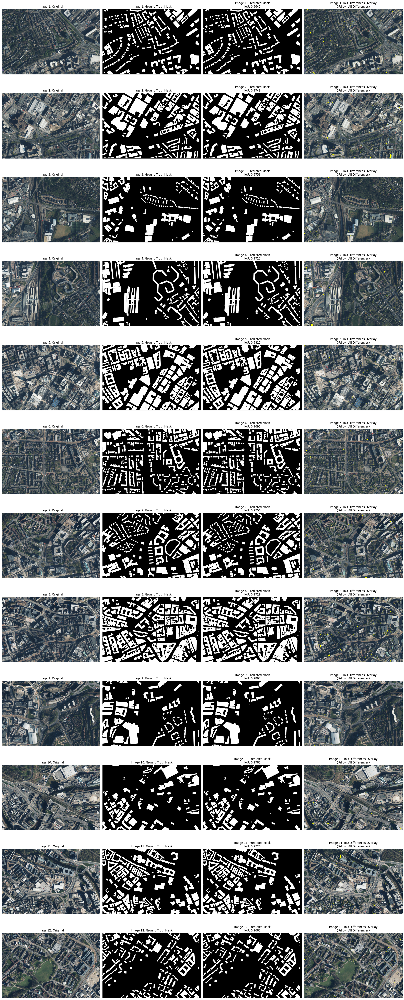


IoU Scores for Each Image:
Image 1: IoU = 0.9647
Image 2: IoU = 0.9749
Image 3: IoU = 0.9758
Image 4: IoU = 0.9717
Image 5: IoU = 0.9817
Image 6: IoU = 0.9691
Image 7: IoU = 0.9750
Image 8: IoU = 0.9729
Image 9: IoU = 0.9807
Image 10: IoU = 0.9782
Image 11: IoU = 0.9728
Image 12: IoU = 0.9682


In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import glob
import re

# Define paths and directories
base_path = "/home/student/skyscan2"
tiles_dir = f'/home/student/skyscan2/Tiles'
input_dir = f'/home/student/skyscan2/patch'
mask_dir = f'/home/student/skyscan2/patch_binary'

# Helper function to extract characters before the dot
def get_all_char_before_dot(s):
    dot_index = s.find('.')
    if dot_index > 0:
        return s[:dot_index]
    else:
        return None

# Load the trained weights
checkpoint_filepath = "/home/student/skyscan2/UNetModelv3/unet_checkpoint_New_LR.h5"
if os.path.exists(checkpoint_filepath):
    model.load_weights(checkpoint_filepath)
    print(f"Loaded weights from {checkpoint_filepath}")
else:
    print(f"Error: Checkpoint file {checkpoint_filepath} not found. Please train the model first.")
    exit()

# Get the list of tile filenames from input_dir (original image tiles)
tile_filenames = sorted(glob.glob(os.path.join(input_dir, '*.png')))
if not tile_filenames:
    print(f"No tiles found in {input_dir}. Please check the directory.")
    exit()
print(f"Total number of tiles in {input_dir}: {len(tile_filenames)}")

# Verify that corresponding mask tiles exist in mask_dir
for filename in tile_filenames:
    mask_filename = os.path.join(mask_dir, os.path.basename(filename))
    if not os.path.exists(mask_filename):
        print(f"Error: Corresponding mask tile {mask_filename} not found in {mask_dir}.")
        exit()

print(f"Mask tiles exist")

# Batch processing parameters
tile_size = 256
batch_size = 16
total_batches = (len(tile_filenames) + batch_size - 1) // batch_size  # Ceiling division

# Function to preprocess a single tile
def preprocess_tile(filename):
    tile = cv2.imread(filename)
    if tile is None:
        print(f"Error: Could not load tile from {filename}. Skipping.")
        return None
    tile = cv2.resize(tile, (tile_size, tile_size))
    tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)
    tile = tile / 255.0  # Normalize to [0, 1]
    return tile

# Process tiles in batches and make predictions
print("Processing tiles and making predictions in batches...")
predictions_binary = []
tile_metadata = []

for i in range(0, len(tile_filenames), batch_size):
    batch_filenames = tile_filenames[i:i + batch_size]
    batch_tiles = []

    # Load and preprocess tiles for the current batch
    for filename in batch_filenames:
        tile = preprocess_tile(filename)
        if tile is not None:
            batch_tiles.append(tile)

        # Extract metadata for this tile
        basename = os.path.basename(filename)
        parts = basename.split('_')
        if len(parts) != 3:
            print(f"Skipping invalid filename: {basename}")
            continue
        try:
            image_idx = int(parts[0])
            x = int(parts[1])
            y = int(parts[2].split('.')[0])
            tile_metadata.append((image_idx, x, y))
        except ValueError:
            print(f"Skipping invalid filename format: {basename}")
            continue

    if not batch_tiles:
        continue  # Skip empty batches

    # Convert batch to NumPy array and predict
    batch_tiles = np.array(batch_tiles)
    batch_num = i // batch_size + 1

    # Print progress only every 100 batches (adjust as needed)
    if batch_num % 100 == 0 or batch_num == 1 or batch_num == total_batches:
        print(f"Batch {batch_num}/{total_batches} - Shape of batch tiles: {batch_tiles.shape}")

    # Predict with reduced verbosity (verbose=0)
    batch_predictions = model.predict(batch_tiles, batch_size=batch_size, verbose=0)
    batch_predictions_binary = (batch_predictions > 0.5).astype(np.uint8)

    # Store predictions for this batch
    for pred in batch_predictions_binary:
        predictions_binary.append(pred)

# Convert predictions to NumPy array
predictions_binary = np.array(predictions_binary)
print(f"Shape of predictions_binary array: {predictions_binary.shape}")

print("Completed Extracting")

if len(tile_metadata) != len(predictions_binary):
    print(f"Error: Number of parsed metadata entries ({len(tile_metadata)}) does not match number of predictions ({len(predictions_binary)}).")
    exit()


# Group predicted masks by image_idx
tiles_by_image = {}
for i, (image_idx, x, y) in enumerate(tile_metadata):
    if image_idx not in tiles_by_image:
        tiles_by_image[image_idx] = []
    tiles_by_image[image_idx].append((x, y, predictions_binary[i]))

print("Complete prediction")

# Load and group ground truth masks by image_idx
ground_truth_by_image = {}
for i, (image_idx, x, y) in enumerate(tile_metadata):
    # Load the corresponding ground truth mask tile
    mask_filename = os.path.join(mask_dir, os.path.basename(tile_filenames[i]))
    mask = cv2.imread(mask_filename, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f"Error: Could not load mask tile from {mask_filename}. Skipping.")
        continue
    mask = cv2.resize(mask, (tile_size, tile_size))  # Ensure consistent size
    mask = (mask > 0).astype(np.uint8)  # Convert to binary (0 or 1)
    if image_idx not in ground_truth_by_image:
        ground_truth_by_image[image_idx] = []
    ground_truth_by_image[image_idx].append((x, y, mask))

# Restitch predicted masks and ground truth masks into full images
results_testing = []  # List to store (original_image, full_mask_gt, full_mask_pred, iou_diff_overlay) for each image_idx
step = 128  # As defined in tile generation
for image_idx in sorted(tiles_by_image.keys()):
    # Get original image to determine its size
    original_image_path = next((f for f in glob.glob(f"{tiles_dir}/*.[pP][nN][gG]") + glob.glob(f"{tiles_dir}/*.[jJ][pP][gG]") if get_all_char_before_dot(os.path.basename(f)) == str(image_idx)), None)
    if original_image_path is None:
        print(f"Could not find original image for index {image_idx} in {tiles_dir}. Skipping.")
        continue

    original_image = Image.open(original_image_path)
    original_width, original_height = original_image.size

    # Initialize full masks for predictions and ground truth
    full_mask_pred = np.zeros((original_height, original_width), dtype=np.uint8)
    full_mask_gt = np.zeros((original_height, original_width), dtype=np.uint8)

    # Stitch predicted masks
    for x, y, mask in tiles_by_image[image_idx]:
        x_start = x
        y_start = y
        x_end = min(x_start + tile_size, original_width)
        y_end = min(y_start + tile_size, original_height)
        mask_cropped = mask.squeeze()[:y_end - y_start, :x_end - x_start]  # Shape: (height, width)

        if x_end - x_start > 0 and y_end - y_start > 0:
            if full_mask_pred[y_start:y_end, x_start:x_end].size > 0:
                full_mask_pred[y_start:y_end, x_start:x_end] = np.where(
                    full_mask_pred[y_start:y_end, x_start:x_end] == 0,
                    mask_cropped,
                    (full_mask_pred[y_start:y_end, x_start:x_end] + mask_cropped) // 2
                )
            else:
                full_mask_pred[y_start:y_end, x_start:x_end] = mask_cropped

    # Stitch ground truth masks
    for x, y, mask in ground_truth_by_image[image_idx]:
        x_start = x
        y_start = y
        x_end = min(x_start + tile_size, original_width)
        y_end = min(y_start + tile_size, original_height)
        mask_cropped = mask[:y_end - y_start, :x_end - x_start]  # Shape: (height, width)

        if x_end - x_start > 0 and y_end - y_start > 0:
            if full_mask_gt[y_start:y_end, x_start:x_end].size > 0:
                full_mask_gt[y_start:y_end, x_start:x_end] = np.where(
                    full_mask_gt[y_start:y_end, x_start:x_end] == 0,
                    mask_cropped,
                    (full_mask_gt[y_start:y_end, x_start:x_end] + mask_cropped) // 2
                )
            else:
                full_mask_gt[y_start:y_end, x_start:x_end] = mask_cropped

    # Calculate IoU
    intersection = np.logical_and(full_mask_gt, full_mask_pred).sum()
    union = np.logical_or(full_mask_gt, full_mask_pred).sum()
    iou_score = intersection / (union + 1e-7)  # Add small epsilon to avoid division by zero

    # Create an overlay to show differences
    iou_diff_overlay = np.array(original_image).copy()  # Shape: (height, width, 3), uint8
    if iou_diff_overlay.shape[-1] == 4:  # If the image has an alpha channel, remove it
        iou_diff_overlay = iou_diff_overlay[..., :3]

    # Identify differences (false positives and false negatives) using XOR
    differences = np.logical_xor(full_mask_gt, full_mask_pred)
    y_diff, x_diff = np.where(differences)

    # Color all differences yellow
    iou_diff_overlay[y_diff, x_diff, :] = [255, 255, 0]  # Yellow for all differences

    # Store the results_testing for this image_idx
    results_testing.append((original_image, full_mask_gt, full_mask_pred, iou_diff_overlay, iou_score))

# Visualize the results_testing for all images in a grid (rows = number of images, columns = 4)
num_images = len(results_testing)
if num_images == 0:
    print("No images to display.")
else:
    plt.figure(figsize=(24, 5 * num_images))  # Adjust width for four subplots
    for i, (original_image, full_mask_gt, full_mask_pred, iou_diff_overlay, iou_score) in enumerate(results_testing, 1):
        # Original Image
        plt.subplot(num_images, 4, (i-1)*4 + 1)
        plt.imshow(original_image)
        plt.title(f"Image {i}: Original")
        plt.axis("off")

        # Ground Truth Mask
        plt.subplot(num_images, 4, (i-1)*4 + 2)
        plt.imshow(full_mask_gt, cmap="gray")
        plt.title(f"Image {i}: Ground Truth Mask")
        plt.axis("off")

        # Predicted Mask with IoU
        plt.subplot(num_images, 4, (i-1)*4 + 3)
        plt.imshow(full_mask_pred, cmap="gray")
        plt.title(f"Image {i}: Predicted Mask\nIoU: {iou_score:.4f}")
        plt.axis("off")

        # IoU Differences Overlay
        plt.subplot(num_images, 4, (i-1)*4 + 4)
        plt.imshow(iou_diff_overlay)
        plt.title(f"Image {i}: IoU Differences Overlay\n(Yellow: All Differences)")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Print IoU scores for each image
print("\nIoU Scores for Each Image:")
for i, (_, _, _, _, iou_score) in enumerate(results_testing, 1):
    print(f"Image {i}: IoU = {iou_score:.4f}")

In [13]:
num_images = len(results_testing)
if num_images == 0:
    print("No images to display.")
else:
    output_dir_testing = os.path.join(base_path, 'FinalResultTesting')  # Use base_path for consistency
    os.makedirs(output_dir_testing, exist_ok=True)  # Create FinalResultTesting if it doesn't exist
    print(f"Saving individual visualizations to {output_dir_testing}")

    for i, (original_image, full_mask_gt, full_mask_pred, iou_diff_overlay, iou_score) in enumerate(results_testing, 1):
        # Create a new figure for each image
        plt.figure(figsize=(24, 5))  # Adjust size as needed

        # Original Image
        plt.subplot(1, 4, 1)  # Use 1 row, 4 columns for each image
        plt.imshow(original_image)
        plt.title(f"Image {i}: Original")
        plt.axis("off")

        # Ground Truth Mask
        plt.subplot(1, 4, 2)
        plt.imshow(full_mask_gt, cmap="gray")
        plt.title(f"Image {i}: Ground Truth Mask")
        plt.axis("off")

        # Predicted Mask with IoU
        plt.subplot(1, 4, 3)
        plt.imshow(full_mask_pred, cmap="gray")
        plt.title(f"Image {i}: Predicted Mask\nIoU: {iou_score:.4f}")
        plt.axis("off")

        # IoU Differences Overlay
        plt.subplot(1, 4, 4)
        plt.imshow(iou_diff_overlay)
        plt.title(f"Image {i}: IoU Differences Overlay\n(Yellow: All Differences)")
        plt.axis("off")

        plt.tight_layout()

        # Define the output file path separately, keeping output_dir_testing as a directory
        output_file_path = os.path.join(output_dir_testing, f"visualization_image_testing_{i}.png")
        plt.savefig(output_file_path, dpi=300, bbox_inches='tight')
        plt.close()  # Close the figure to free memory
        print(f"Saved visualization for image {i} to {output_file_path}")

print("Visualization saving completed.")

Saving individual visualizations to /home/student/skyscan2/FinalResultTesting
Saved visualization for image 1 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_1.png
Saved visualization for image 2 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_2.png
Saved visualization for image 3 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_3.png
Saved visualization for image 4 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_4.png
Saved visualization for image 5 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_5.png
Saved visualization for image 6 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_6.png
Saved visualization for image 7 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_7.png
Saved visualization for image 8 to /home/student/skyscan2/FinalResultTesting/visualization_image_testing_8.png
Saved visualization for image 9 to